In [1]:
# Imports

import csv
import pandas as pd
import nltk
import numpy as np
import random
import re
import string


from os import listdir
from os.path import isfile, join
from collections import Counter

from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from matplotlib import pyplot as plt
from wordcloud import WordCloud


# Global and Vars

STOP = set(stopwords.words('english'))
PUNCT = set(string.punctuation)
LEMMA = WordNetLemmatizer()
WC = WordCloud(
    mode = "RGBA", collocations = False, background_color = None, 
    width=1500, height=1000
)

# Functions

def clean(doc):
    stop_free = " ".join(
        [i for i in doc.lower().split() if i not in STOP]
    )
    punc_free = "".join(
        [ch for ch in stop_free if ch not in PUNCT]
    )
    normalized = " ".join(
        LEMMA.lemmatize(word) for word in punc_free.split()
    )
    return normalized

def noun_clean(x):
    clean_x = clean(x)
    tokens = nltk.word_tokenize(clean_x)
    tags = nltk.pos_tag(tokens)
    nouns = [
        word 
        for word, pos in tags 
        if (
            pos == 'NN' 
            or pos == 'NNP' 
            or pos == 'NNS' 
            or pos == 'NNPS'
        )
    ]
    return " ".join(nouns)

def plot_wc(text_list):
    word_cloud = WC.generate(" ".join(text_list))
    plt.figure( figsize=(30,20) )
    # Display the generated Word Cloud
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

# Read the data

In [2]:
# Download data from https://archive.ics.uci.edu/ml/datasets/opinrank+review+dataset

parent_path = "OpinRankDataset/hotels/new-york-city"
files = [
    join(parent_path, f) 
    for f in listdir(parent_path) 
    if isfile(join(parent_path, f))
]
# For this exercise, we combine all hotel reviews in one dataframe
print(f"Fetched reviews for {len(files)} hotels in New York City\n")
df = pd.DataFrame()
for f in files:
    df = pd.concat(
        [
            df, 
            pd.read_csv(
                f, sep="\t", encoding="latin", quoting=csv.QUOTE_NONE,#csv.QUOTE_NONE, 
                index_col=False, names=["date", "title", "review"], header=None
            )
        ], ignore_index=True)

print(df.head())

Fetched reviews for 258 hotels in New York City

           date                                              title  \
0   Nov 18 2009                   Mary's Going Off to College Bash   
1   Nov 5 2009    The standard you would expect but the price.....   
2  Oct 26 2009   Honestly? For a St Regis it was very disappoin...   
3  Oct 19 2009                                         Outstanding   
4  Oct 15 2009                             I've got a butler!!??!!   

                                              review  
0  Neal Buker etc. We didn't have much of a view ...  
1  It is a very nice hotel....as you would expect...  
2  I stayed in St Regis halfway through my trip i...  
3  We visit NYC twice a year and always stay at t...  
4  We stayed at the St. Regis for 3 nights with o...  


In [3]:
# Print data stats
reviews = df["review"].dropna()
lens = [len(rev.strip()) for rev in reviews]
print(f"""
    Total no. of reviews are {len(reviews)}
    Shortest review length: {min(lens)} chars
    Longest review length: {np.median(lens)} chars
    Mean review length: {np.mean(lens)} chars
    Median review length: {max(lens)} chars
    """)

# Assign each review as ID
id_review = {k: v for k, v in enumerate(reviews)}


    Total no. of reviews are 50656
    Shortest review length: 10 chars
    Longest review length: 793.0 chars
    Mean review length: 980.9229311433986 chars
    Median review length: 19846 chars
    


# Sentiment analysis

In [4]:
!pip install textblob==0.17.1

In [5]:
from textblob import TextBlob

In [6]:
sentiment = {}
for rev_id, rev in id_review.items():
    pol = TextBlob(rev).sentiment.polarity
    if pol > 0:
        sent = "pos"
    elif pol < 0:
        sent = "neg"
    else:
        sent = "neu"
    sentiment[rev_id] = {"class": sent, "polarity": pol}

In [7]:
# count positive, negative, and neutral sentiments
sent_classes = [sent["class"] for _, sent in sentiment.items()]
print(f"Sentiment distribution: {Counter(sent_classes)}")

Sentiment distribution: Counter({'pos': 47976, 'neg': 2618, 'neu': 62})


In [8]:
print("\nPositive\n", random.sample(
    [id_review[i] for i in sentiment if sentiment[i]["class"]=="pos"], 10)
)
print("\nNeutral\n", random.sample(
    [id_review[i] for i in sentiment if sentiment[i]["class"]=="neu"], 10)
)
print("\nNegative\n", random.sample(
    [id_review[i] for i in sentiment if sentiment[i]["class"]=="neg"], 10)
)


Positive
 ["We booked this hotel on the strength of some trip advisor reviews - we weren't disappointed. The staff at the desk and the concierge were so helpful  he arranged a great dinner cruise for us on our last night in New York. It has a warmth and friendliness that is so often lacking in big city hotels. Our room was a great size, clean and comfortable. The location was ideal - easy walking distance for Fifth Avenue, time square, central park, great shopping, the Chrysler building and grand central. Don't miss the opportunity to cut through Grand Central when you go out and about. There are loads of great places for breakfast on the doorstep - try Breakfast Central opposite the Grand Central entrance on 42nd.",
 "My family stayed here right before Christmas. Granted this is not The Plaza, but the staff were extremely friendly and accommodating, the rooms were clean and the beds were amazingly comfortable. In fact I've never had a good night's sleep in any hotel in my life excep

In [8]:
negatives_all = []
positives_all = []

for rev_id in sentiment:
    if sentiment[rev_id]["class"] == "neg":
        negatives_all.append(rev_id)
    if sentiment[rev_id]["class"] == "pos":
        positives_all.append(rev_id)

In [9]:
subset = set(random.sample(list(id_review.keys()), int(len(id_review)*0.75)))
"""import pickle
with open("copy1_subset.pickle", "rb") as f:
    subset = pickle.load(f)"""
negatives = [rev_id for rev_id in negatives_all if rev_id in subset]
positives = [rev_id for rev_id in positives_all if rev_id in subset]
print(f"""
    Taking a subset of {len(positives)} positive sentiment reviews 
    and {len(negatives)} negative sentiment reviews"""
)


    Taking a subset of 35972 positive sentiment reviews 
    and 1978 negative sentiment reviews


## Plot positive and negative review word clouds to understand themes

In [49]:
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from matplotlib import pyplot as plt
from wordcloud import WordCloud


# Global and Vars

STOP = set(stopwords.words('english'))
PUNCT = set(string.punctuation)
LEMMA = WordNetLemmatizer()
WC = WordCloud(
    mode = "RGBA", collocations = False, background_color = None, 
    width=1500, height=1000
)

# Functions

def clean(doc):
    stop_free = " ".join(
        [i for i in doc.lower().split() if i not in STOP]
    )
    punc_free = "".join(
        [ch for ch in stop_free if ch not in PUNCT]
    )
    normalized = " ".join(
        LEMMA.lemmatize(word) for word in punc_free.split()
    )
    
    return " ".join([i for i in normalized.split() if len(i)>1])

def noun_clean(x):
    clean_x = clean(x)
    tokens = nltk.word_tokenize(clean_x)
    tags = nltk.pos_tag(tokens)
    nouns = [
        word 
        for word, pos in tags 
        if (
            pos == 'NN' 
            or pos == 'NNP' 
            or pos == 'NNS' 
            or pos == 'NNPS'
        )
    ]
    return " ".join(nouns)

def plot_wc(text_list):
    word_cloud = WC.generate(" ".join(text_list))
    plt.figure( figsize=(30,20) )
    # Display the generated Word Cloud
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

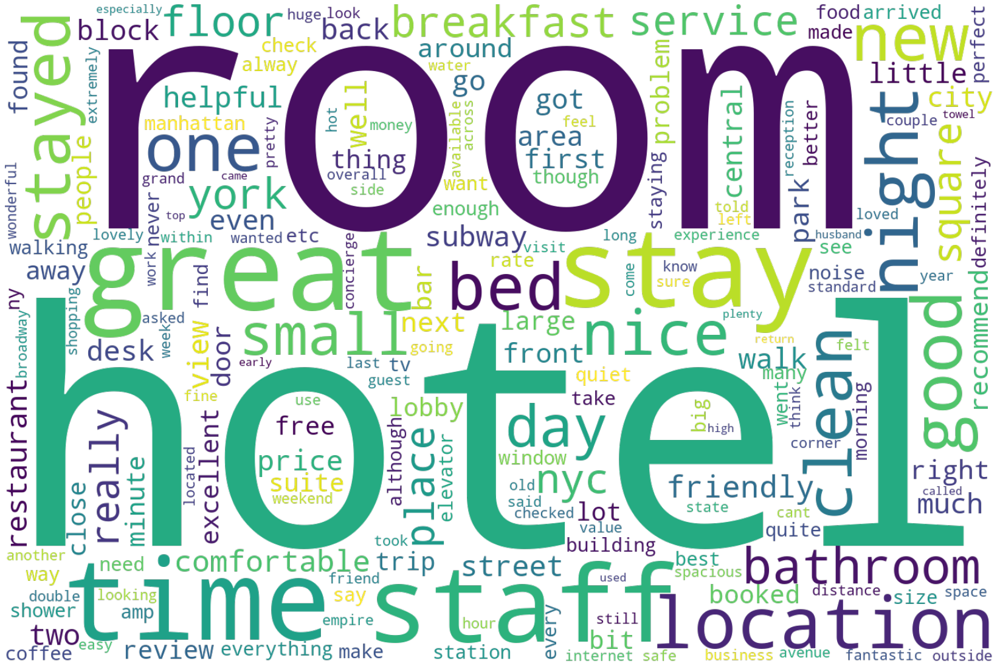

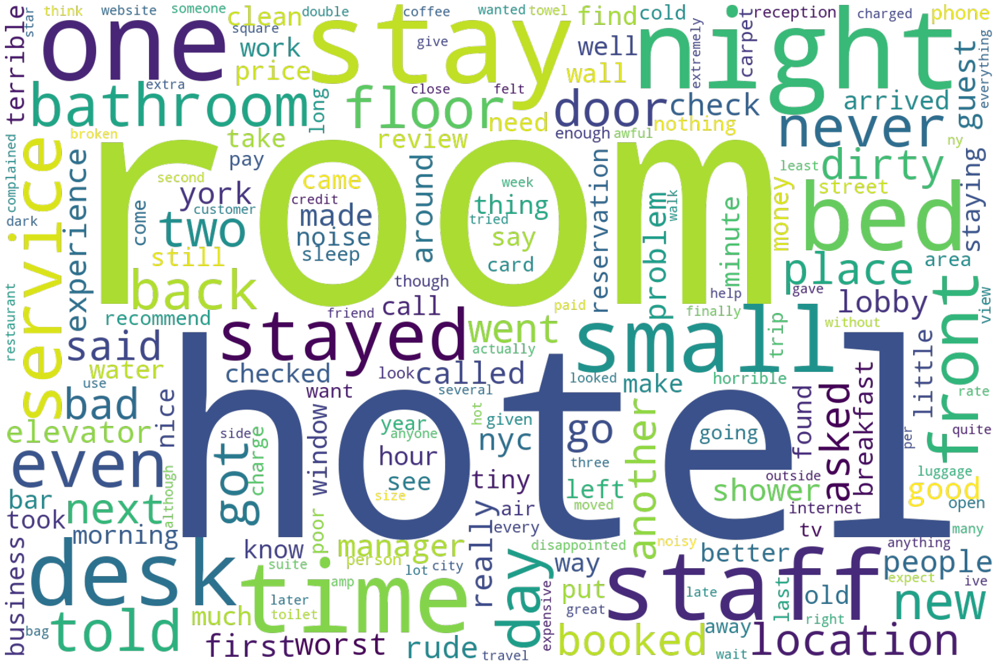

In [50]:
# positives
plot_wc([clean(id_review[i]) for i in positives])
# negatives
plot_wc([clean(id_review[i]) for i in negatives])

In [51]:
# we see room and hotel are highest occuring words in reviews.
# we also see some irrelevant words, such as next, much, want, etc. 
# Next, we retain only nouns ansd plot word clouds again.

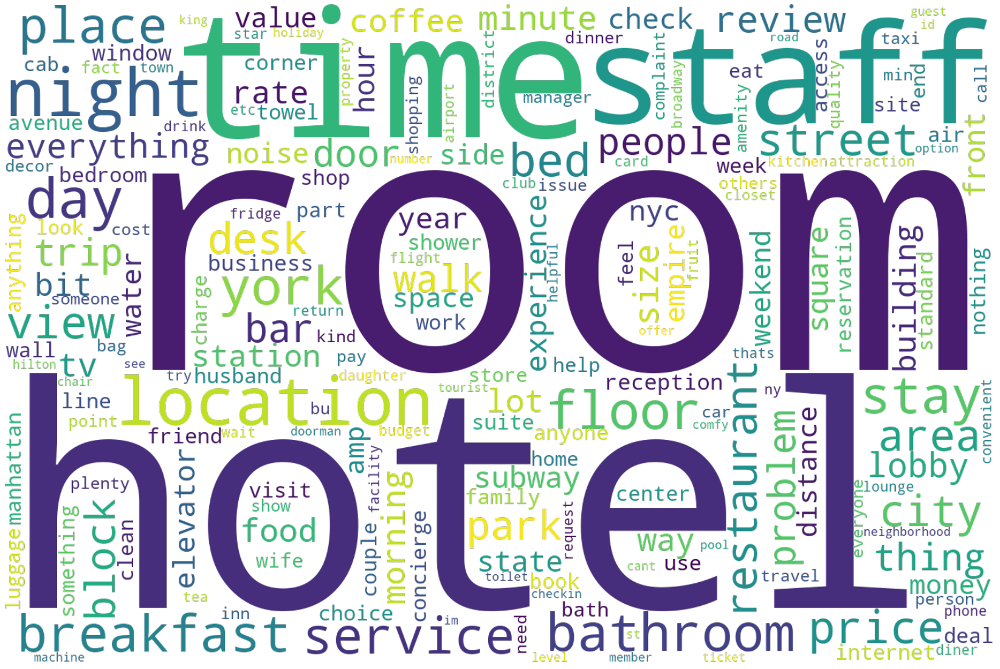

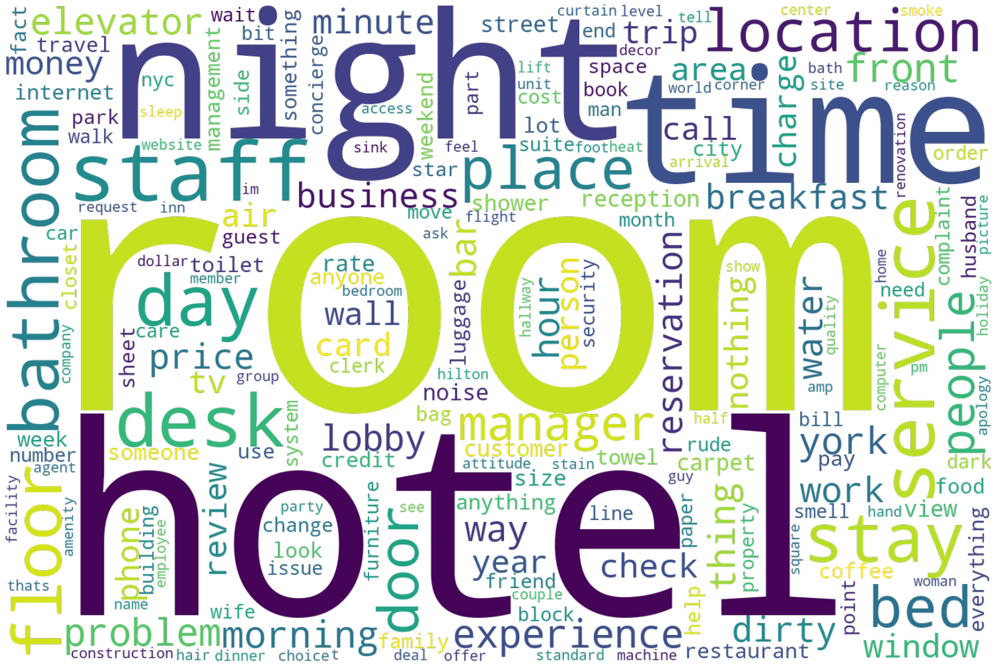

In [52]:
# positives
noun_pos = [
    noun_clean(id_review[rev_id]) 
    for rev_id in positives
]
plot_wc(noun_pos)
# negatives
noun_neg = [
    noun_clean(id_review[rev_id]) 
    for rev_id in negatives
]
plot_wc(noun_neg)

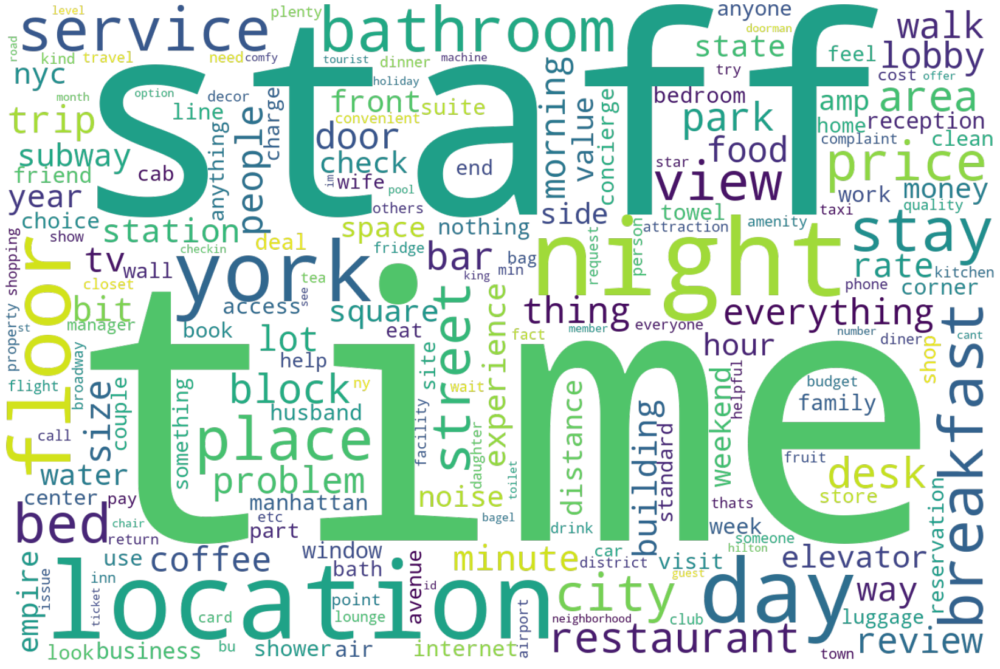

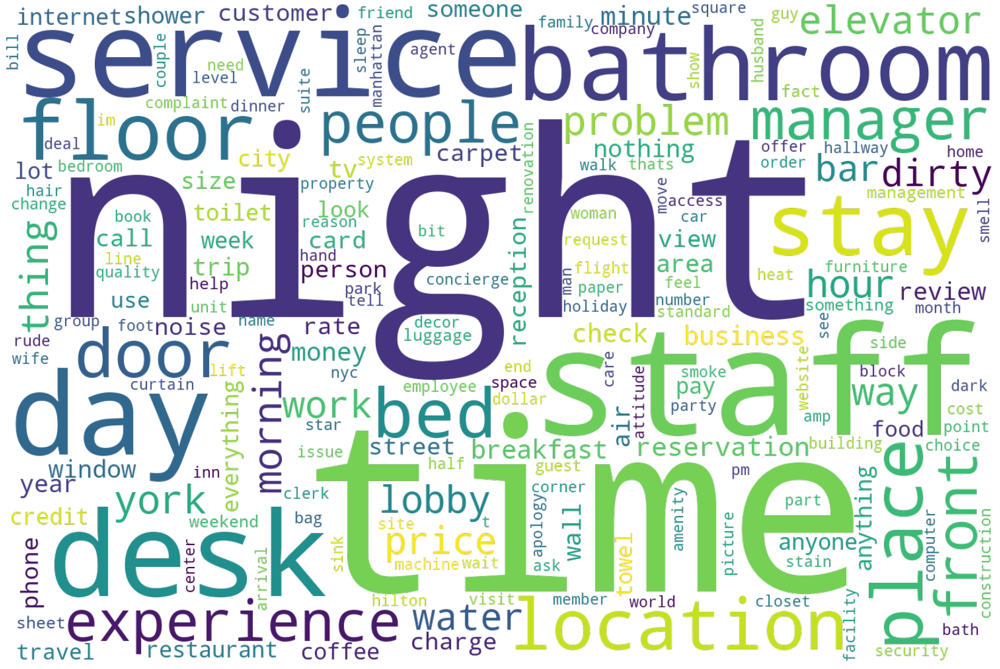

In [53]:
# hotel and room are the top occuring terms. 
# We remove those and plot word clouds again to get a better sense of remaining themes.
# Furthermore, we remove any words less than 2 characters in length

clean_pos = [
    " ".join(
        [
            j for j in i.split() 
            if j not in [
                "room", "hotel", "quot"
            ]
        ]
    ) for i in noun_pos
]
plot_wc(clean_pos)

clean_neg = [
    " ".join(
        [
            j for j in i.split() 
            if j.lower() not in [
                "room", "hotel", "quot"
            ] and len(j) >= 2
        ]
    ) 
    for i in noun_neg
]
plot_wc(clean_neg)

In [54]:
# we see some common words with different weightages in boht positive and negative reviews.
# an important aspect seems to be related to "room", staff & service, location

# Splitting reviews into phrases/sentences

Since each review can contain multiple topics, we split the reviews into phrases using SENT_SPLIT. 
E.g. If review ID 8 corresponds to review "Close to central park. I threw a wonderful event there and the staff couldn't be more helpful.",
new_id_docs will represent it as (8, ["close", "central", "park"]), (8, ["threw", "wonderful", "event", "staff", "helpful"])

In [55]:
import re

SENT_SPLIT = ',|\.|\?|\!|\n'

new_id_docs = []
for rev_id, rev in id_review.items():
    if rev_id in subset:
        rev_split = re.split(SENT_SPLIT, rev)
        for phrase in rev_split:
            # get each word in the cleaned phrase
            words = clean(phrase).split()
            # only select cleaned phrases 
            # that contain more than 2 words
            if len(words) > 2:
                new_id_docs.append((rev_id, words))

In [56]:
loc_set = {"location"}
room_set = {"room", "bed", "bathroom", "bedroom"}
serv_set = {"service", "staff"}

def filter_by_words(new_id_docs, word_set):
    return [
        itm for itm in new_id_docs 
        if any(w in itm[1] for w in word_set)
    ]

location = filter_by_words(new_id_docs, loc_set)
room = filter_by_words(new_id_docs, room_set)
serv = filter_by_words(new_id_docs, serv_set)


For location



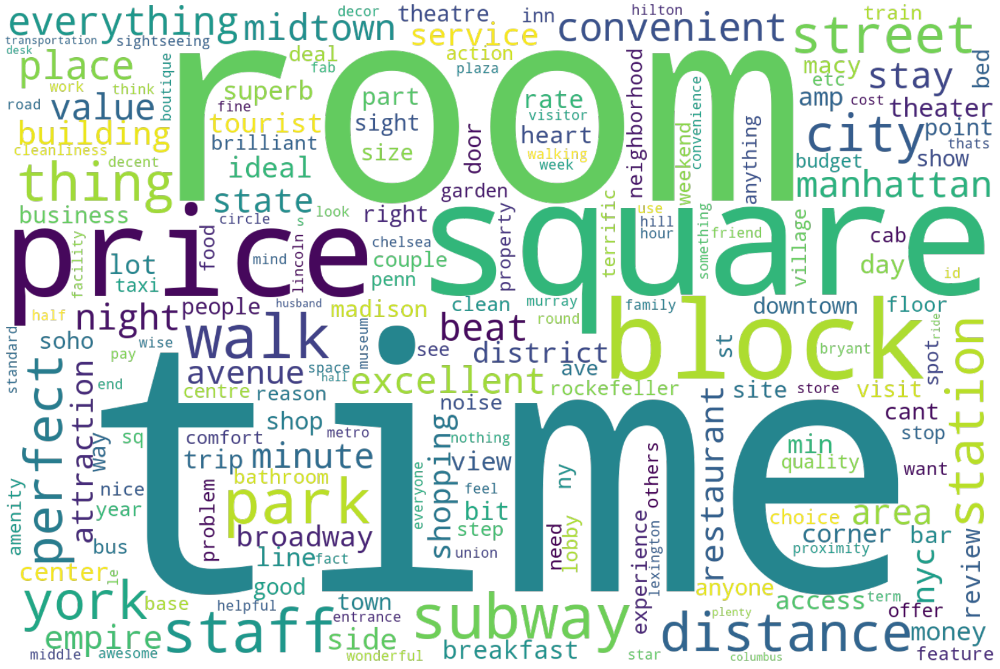


For room



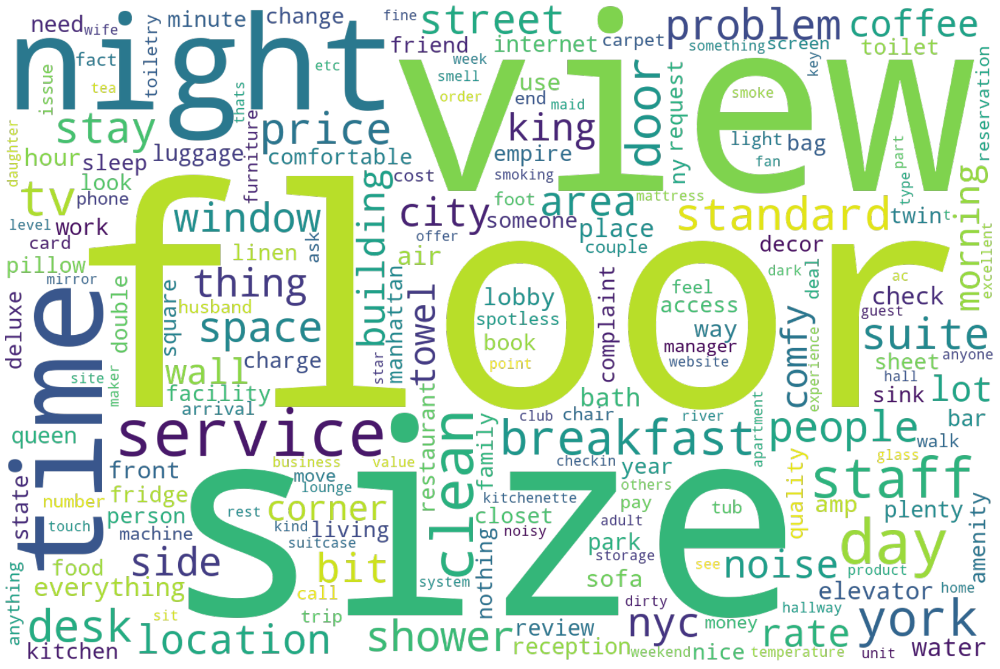


For staff and service



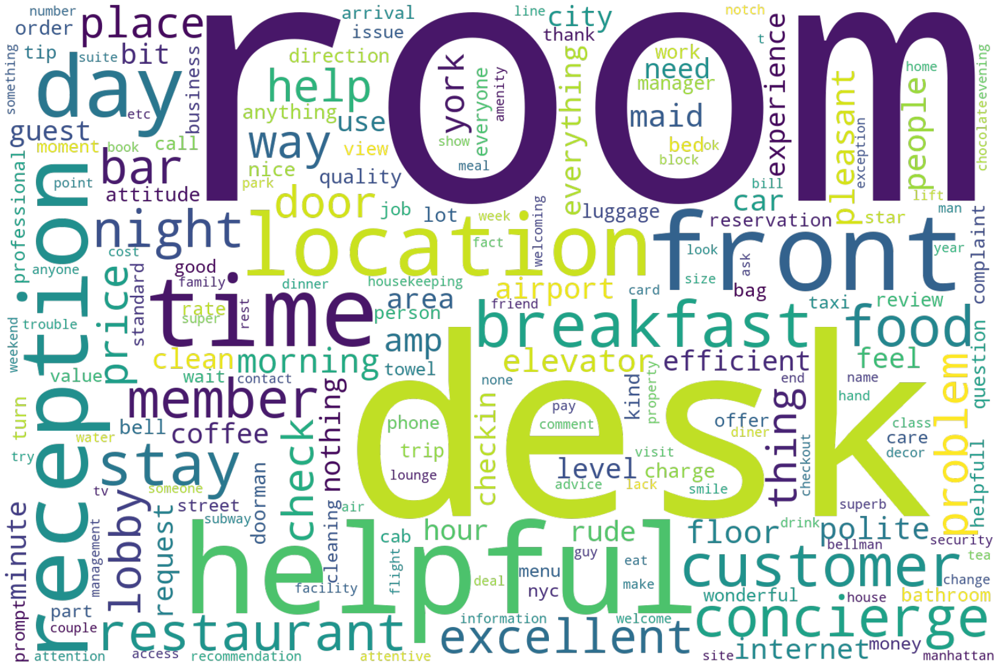

In [57]:
remove_set = {"hotel"}

def clean_training_samples(id_words, remove_words):
    nouns = [
        noun_clean(
            " ".join([
                w for w in word_list
                if w not in remove_words
            ])
        )
        for _, word_list in id_words
    ]
    return nouns

print("\nFor location\n")
plot_wc(clean_training_samples(
    location, set.union(remove_set, loc_set))
)
print("\nFor room\n")
plot_wc(clean_training_samples(
    room,  set.union(remove_set, room_set))
)
print("\nFor staff and service\n")
plot_wc(clean_training_samples(
    serv, set.union(remove_set, serv_set))
)

# do NER on location sentences that are not lower cased.

In [58]:
loc_set = {
    "location", "subway", "walking", "street", "block",
    "distance", "walk", "park", "midtown", "manhattan",
    "empire", "avenue", "shop", "attraction"
}
"""natural_distn = {}
for loc_word in loc_set:
        natural_distn[loc_word] = len([itm for itm in new_id_docs if loc_word in itm[0]])"""

loc_set_dual = {"time", "square"}
location_train = []
for rev_id, word_list in new_id_docs:
    for loc_word in loc_set:
        if loc_word in word_list:
            location_train.append(
                (rev_id, word_list)#[w for w in word_list if w != loc_word])
            )
    if len(
        [w for w in loc_set_dual if w in word_list]
    ) == loc_set_dual:
            location_train.append(
                (
                    rev_id,  
                    word_list
                    #[
                    #    w for w in word_list 
                    #    if w not in loc_set_dual
                    #]
                )
            )
print(len(location), len(location_train))
# >> 18292 88196

18224 87882


In [59]:
room_set = {
    "bath", "floor", "shower", "window", "space", 
    "room", "bed", "bathroom", "bedroom"
}
room_train = []
for rev_id, word_list in new_id_docs:
    for room_word in room_set:
        if room_word in word_list:
            room_train.append(
               (rev_id,  word_list)#[w for w in word_list if w != room_word])
           )
print(len(room), len(room_train))
# >> (103584, 141598)


103248 141193


In [60]:
serv_set = {
    "service", "staff", "reception", "concierge", 
    "desk", "front", "helpful", "customer", "breakfast", 
    "food", "restaurant", "problem", "polite", "help"
}
serv_train = []
for rev_id, word_list in new_id_docs:
    for serv_word in serv_set:
        if serv_word in word_list:
            serv_train.append(
                (rev_id, word_list)#[w for w in word_list if w != serv_word])
            )
print(len(serv), len(serv_train))
# >> (33749, 105870)

33716 105753


# Prepare data to pass into the classifier

In [61]:
cleaned_data = (
    [
        (" ".join(word_list), "staff_serv") 
        for _, word_list in serv_train 
        if len(word_list) > 2
    ] + [
        (" ".join(word_list), "loc") 
        for _, word_list in location_train
        if len(word_list) > 2
    ] + [
        (" ".join(word_list), "room") 
        for _, word_list in room_train
        if len(word_list) > 2
    ]
)

random.shuffle(cleaned_data)
x = [itm[0] for itm in cleaned_data]
y = [itm[1] for itm in cleaned_data]

In [95]:
# checking random samples of training data for manual verification
random_room = random.sample([i for i in cleaned_data if i[1]=="room"], 10)
random_ss = random.sample([i for i in cleaned_data if i[1]=="staff_serv"], 10)
random_loc = random.sample([i for i in cleaned_data if i[1]=="loc"], 10)
print(f"room: {random_room}\n\nstaff_serv: {random_ss}\n\nloc: {random_loc}")

room: [('jacuzzi tub sitting room', 'room'), ('shared bathroom spotless obviously well cared', 'room'), ('called front desk simply explained whole 10th floor nonsmoking', 'room'), ('also shower cap', 'room'), ('asked room view top floor given exactly', 'room'), ('room got bigger expected bed comfortable', 'room'), ('prefer stay larger room', 'room'), ('bed comfortable ive ever hotel room excellent size double bed plenty wardrobe space free safety deposit box', 'room'), ('queen bed small bathroom', 'room'), ('mirror room handbasin bathroom therefore impossible check looked going', 'room')]

staff_serv: [('even though one annoying staff always still bed regular servicing hour', 'staff_serv'), ('one call front desk would delivered room', 'staff_serv'), ('yogurt breakfast room', 'staff_serv'), ('service hotel exceeded expectation', 'staff_serv'), ('breakfast first morning much preferred randolphs bar', 'staff_serv'), ('barbara concierge incredible friendly went way helpful', 'staff_serv'),

# Pass through mutlinomial NB classifier with hyperparam tuning


    Best alpha     : 0.6
    Avg. Precision : 0.9038263393190872
    Avg. Recall    : 0.9019587524456725
    Avg. F1        : 0.9028663441813923

    
Per class evaluation
    Classes        : ['loc' 'room' 'staff_serv']
    Precision      : [0.90954797 0.90761899 0.89431205]
    Recall         : [0.89934325 0.91914545 0.88738756]
    F1             : [0.90441682 0.91334586 0.89083635]


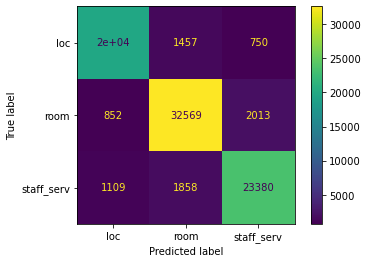

In [62]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

train_x, valid_x, train_y, valid_y = train_test_split(x, y)

vectorizer = TfidfVectorizer(max_df=0.9, min_df=0.01, max_features=5000)
X_train = vectorizer.fit_transform(train_x)
X_valid = vectorizer.transform(valid_x)

from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy
def multinomialBN_model(X_train, train_y, X_valid, valid_y, alpha=1.0):
    model = MultinomialNB(alpha=alpha).fit(X_train.todense(), train_y)
    y_pred = model.predict(X_valid.todense())
    (
        prec, recall, f1, class_size
    ) = precision_recall_fscore_support(
        valid_y, y_pred, average=None, labels=model.classes_
    )
    scores = {"class_order": model.classes_, "precision": prec, "recall": recall, "f1": f1, "avg prec": numpy.mean(prec), "avg recall": numpy.mean(recall), "avg f1": numpy.mean(f1)}
    return model, scores, y_pred

models = {}
for alpha in [0.1, 0.2, 0.4, 0.6, 0.8, 1.0]:
    models[alpha] = multinomialBN_model(X_train, train_y, X_valid, valid_y, alpha=alpha)
f1_max = max([models[alpha][1]["avg f1"] for alpha in models])
best_alpha, best_model, best_score, y_pred = [(alpha, models[alpha][0], models[alpha][1], models[alpha][2])  for alpha in models if models[alpha][1]["avg f1"]==f1_max][0]
print(f"""
    Best alpha     : {best_alpha}
    Avg. Precision : {best_score["avg prec"]}
    Avg. Recall    : {best_score["avg recall"]}
    Avg. F1        : {best_score["avg f1"]}""")
print(f"""
    \nPer class evaluation
    Classes        : {best_score["class_order"]}
    Precision      : {best_score["precision"]}
    Recall         : {best_score["recall"]}
    F1             : {best_score["f1"]}""")

cm = confusion_matrix(valid_y, y_pred, labels=best_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()

In [63]:
best_model.classes_

array(['loc', 'room', 'staff_serv'], dtype='<U10')

In [64]:
best_model.predict_proba(vectorizer.transform([clean("the parking was good")]))

array([[0.261997  , 0.34685359, 0.39114941]])

In [65]:
best_model.predict_proba(vectorizer.transform([clean("booked this hotel for a stay on friday")]))

array([[0.14035649, 0.63271964, 0.22692387]])

In [66]:
best_model.predict_proba(vectorizer.transform([clean("the bedroom was spacious")]))

array([[0.01861395, 0.95868893, 0.02269712]])

In [67]:
best_model.predict_proba(vectorizer.transform([clean("loved the size and view")]))

array([[0.0493146 , 0.92877279, 0.02191261]])

In [68]:
best_model.predict_proba(vectorizer.transform([clean("comfortable sleep")]))

array([[0.04581014, 0.89104821, 0.06314165]])

In [69]:
best_model.predict_proba(vectorizer.transform([clean("very close to downtown")]))
# downtown was not in our initial keyword list.

array([[0.73052715, 0.1229511 , 0.14652175]])

In [71]:
best_model.predict_proba(vectorizer.transform([clean("very close to downtown and staff was nice too.")]))

array([[0.22643263, 0.17179436, 0.60177301]])

In [72]:
best_model.predict_proba(vectorizer.transform([clean("the stfaf was very friendly")]))


array([[0.02783871, 0.05178206, 0.92037924]])

In [73]:
best_model.predict_proba(vectorizer.transform([clean("the manager gave us a free upgrade.")]))


array([[0.07696669, 0.36980228, 0.55323103]])

In [87]:
best_model.predict_proba(vectorizer.transform([clean("the frontdesk was talking to us")]))


array([[0.26264629, 0.42114757, 0.31620613]])

# Prepare unseen test data

In [96]:
clean_test = {}
for rev_id, rev in id_review.items():
    if rev_id not in subset:
        phrase_list = re.split(SENT_SPLIT, rev)
        clean_test[rev_id] = [
            clean(phr) for phr in phrase_list
        ]


In [97]:
print(f"{len(clean_test)} unseen test samples were prepared")

12664 unseen test samples were prepared


In [98]:
# manual checks on results for deciding thresholds and accuracy
test_model = []
for rev_id in clean_test:
    for phr in clean_test[rev_id]:
        if len(phr.split()) >= 2:
            (p1, p2, p3) = best_model.predict_proba(
                vectorizer.transform([phr])
            )[0]
            test_model.append([rev_id, phr, p1, p2, p3])

In [99]:
# Random sample for testing
pd.DataFrame(
    random.sample(test_model, 500), 
    columns=["id", "words"] + best_model.classes_
).to_csv("model_phr_test.csv")

In [100]:
print(f"""
    Got {83/88} accuracy on manually checking 88 valid classifications,
    i.e., classifications excluding phrases hat do not belong to any class
    and have a low probability score across classes. The threshold of {0.62} 
    gives us > {95}% good results."""
)



    Got 0.9431818181818182 accuracy on manually checking 88 valid classifications,
    i.e., classifications excluding phrases hat do not belong to any class
    and have a low probability score across classes. The threshold of 0.62 
    gives us > 95% good results.


In [101]:
# Set threshold as decided from the dataset above
# Gather top classifications for the unseen test samples per review.
classes_pred={}
for rev_id in clean_test:
    classes_pred[rev_id] = []
    for phr in clean_test[rev_id]:
        if len(phr.split()) >= 2:
            pred = best_model.predict_proba(
                vectorizer.transform([phr])
            )[0]
            if max(pred) >= 0.62:
                classes_pred[rev_id].append(
                    best_model.classes_[
                        np.where(pred == max(pred))[0][0]
                    ]
                )


In [102]:
# Take a sample of 100 reviews to check results
rand_sample = random.sample(list(classes_pred.keys()), 100)
sample_classifications = []
for rev_id in rand_sample:
    sample_classifications.append(
        [
            rev_id, 
            id_review[rev_id], 
            Counter(classes_pred[rev_id]).most_common(),
            sentiment[rev_id]["class"]
        ]
    )

In [106]:
for samp in sample_classifications[0:5]:
    print(samp)

[45522, "Stayed here for 4 nights and really enjoyed it - staff were friendly and the rooms were lovely...had a real charm old school feeling. Don't be put off by the negative reviews here....we really did not have anything to complain about, it was great", [('staff_serv', 1)], 'pos']
[28214, "This was the complaint I sent to Marriot, with slight amendments : My wife and stayed at MarrioT NY East Side last week from Mar 20 to 23. I must say that we will by any means necessary avoid Marriot hotels in the future.We had been recommended your hotel by a friend who actually works for Marriot in HK.Right from our arrival, unhappiness was caused:- We had an early flight in from Vegas, so we requested for an early check. No rooms were available, and a lady staff told us that. I persisted to ask if &quot;it was at all possible&quot; and &quot;what if we upgraded to another better room&quot;, and &quot;nothing at all, are u sure?&quot; - BOTH ladies at your front desk reacted defensively, with o

In [46]:
# save to csv file using pandas if desired
pd.DataFrame(
    sample_classifications, 
    columns=["id", "review", "classifications"]
).to_csv("clf_model_sample100.csv")

In [47]:
import pickle

# to save
with open('hotel_NBclf.pkl','wb') as f:
    pickle.dump(best_model, f)

# to load
"""
# load
with open('model.pkl', 'rb') as f:
    clf2 = pickle.load(f)
"""

## LDA topic modeling 

In [21]:
import gensim
from gensim import corpora

# Creating the object for LDA model using gensim library
Lda = gensim.models.ldamodel.LdaModel


In [25]:
dictionary_pos = corpora.Dictionary(
    [phr_list for _, phr_list in new_id_docs]
)
test_matrix = [
    (rev_id, dictionary_pos.doc2bow(phr_list)) 
    for rev_id, phr_list in new_id_docs
]
doc_term_matrix=[itm[1] for itm in test_matrix]

In [185]:
# Running and Training LDA model on the document term matrix for 2 topics.
lda_2 = Lda(
    doc_term_matrix, 
    num_topics=2, 
    id2word=dictionary_pos,
    passes=10)
# Results
for itm in lda_2.print_topics():
    print(itm)
    print("\n")
# room, staff, service -> 0
# location -> 1

(0, '0.053*"room" + 0.014*"staff" + 0.011*"bed" + 0.011*"u" + 0.009*"floor" + 0.009*"nice" + 0.008*"bathroom" + 0.008*"small" + 0.008*"clean" + 0.008*"service"')


(1, '0.054*"hotel" + 0.017*"time" + 0.016*"stay" + 0.016*"would" + 0.016*"great" + 0.015*"night" + 0.012*"new" + 0.012*"stayed" + 0.011*"location" + 0.009*"york"')




In [186]:
# Running and Training LDA model on the document term matrix for 3 topics.
lda_3 = Lda(
    doc_term_matrix, 
    num_topics=3, 
    id2word=dictionary_pos, 
    passes=10
)
# Results
for itm in lda_3.print_topics():
    print(itm)
    print("\n")
    
# location -> 0
# room -> 1
# staff and service -> 2

(0, '0.058*"hotel" + 0.023*"time" + 0.021*"stay" + 0.021*"would" + 0.021*"great" + 0.015*"stayed" + 0.015*"night" + 0.015*"location" + 0.010*"place" + 0.009*"good"')


(1, '0.085*"room" + 0.018*"bed" + 0.018*"new" + 0.015*"hotel" + 0.015*"floor" + 0.014*"york" + 0.014*"bathroom" + 0.014*"small" + 0.012*"clean" + 0.010*"like"')


(2, '0.023*"staff" + 0.019*"u" + 0.013*"breakfast" + 0.013*"service" + 0.011*"day" + 0.010*"desk" + 0.010*"friendly" + 0.009*"helpful" + 0.009*"front" + 0.008*"get"')




In [187]:
# Creating the object for LDA model using gensim library
Lda = gensim.models.ldamodel.LdaModel
# Running and Training LDA model on the document term matrix for 3 topics.
lda_model_pos_4 = Lda(doc_term_matrix, num_topics=4, id2word = dictionary_pos, passes=10)
# Results
for itm in lda_model_pos_4.print_topics():
    print(itm)
    print("\n")
# staff and service -> 0
# room -> 2
# location ->3

(0, '0.029*"staff" + 0.024*"u" + 0.022*"hotel" + 0.013*"service" + 0.013*"desk" + 0.012*"friendly" + 0.012*"helpful" + 0.011*"front" + 0.010*"could" + 0.009*"get"')


(1, '0.061*"hotel" + 0.031*"stay" + 0.028*"night" + 0.025*"would" + 0.023*"new" + 0.022*"stayed" + 0.017*"york" + 0.015*"nyc" + 0.014*"time" + 0.011*"city"')


(2, '0.108*"room" + 0.023*"bed" + 0.019*"floor" + 0.018*"nice" + 0.017*"bathroom" + 0.017*"small" + 0.016*"clean" + 0.012*"view" + 0.010*"comfortable" + 0.008*"shower"')


(3, '0.023*"hotel" + 0.022*"location" + 0.020*"time" + 0.018*"great" + 0.017*"breakfast" + 0.013*"square" + 0.012*"walk" + 0.012*"restaurant" + 0.011*"block" + 0.010*"around"')




In [188]:
# Creating the object for LDA model using gensim library
Lda = gensim.models.ldamodel.LdaModel
# Running and Training LDA model on the document term matrix for 3 topics.
lda_model_pos_5 = Lda(doc_term_matrix, num_topics=5, id2word = dictionary_pos, passes=10)
# Results
for itm in lda_model_pos_5.print_topics():
    print(itm)
    print("\n")
# location -> 0
# room -> 1
# room -> 2
# staff -> 3

(0, '0.032*"location" + 0.032*"great" + 0.025*"hotel" + 0.025*"time" + 0.019*"square" + 0.018*"walk" + 0.017*"street" + 0.016*"block" + 0.014*"subway" + 0.012*"central"')


(1, '0.047*"room" + 0.029*"hotel" + 0.023*"clean" + 0.023*"bed" + 0.020*"like" + 0.018*"bathroom" + 0.018*"well" + 0.015*"comfortable" + 0.015*"small" + 0.012*"review"')


(2, '0.059*"room" + 0.022*"good" + 0.019*"breakfast" + 0.016*"hotel" + 0.012*"price" + 0.011*"service" + 0.011*"great" + 0.010*"bed" + 0.009*"small" + 0.009*"one"')


(3, '0.048*"hotel" + 0.040*"stay" + 0.039*"would" + 0.036*"staff" + 0.029*"new" + 0.022*"york" + 0.015*"desk" + 0.015*"friendly" + 0.014*"helpful" + 0.013*"front"')


(4, '0.029*"night" + 0.029*"room" + 0.024*"u" + 0.023*"stayed" + 0.019*"day" + 0.017*"hotel" + 0.013*"one" + 0.013*"floor" + 0.010*"time" + 0.008*"get"')




In [48]:
### one can add location data from clusters above to training set for enhancement

In [58]:
# to save model
from gensim.test.utils import datapath

f = datapath("lda_5")
lda_5.save(f)

# to load
"""
from gensim import models
lda_5 =  models.LdaModel.load("lda_5")
"""

In [29]:
# Obtaining original phrases along with 
# the cluster they belong to for topic 0 lda_5
from operator import itemgetter 

topic_loc = []
for i in range(len(test_matrix)):
    q = lda_model_pos_5[test_matrix[i][1]]
    res = max(q, key = itemgetter(1))[0]
    if res == 0:
        topic_loc.append(new_id_docs[i])


In [36]:
rand_sample_loc = random.sample(topic_loc, 100) # for checking manually
df_loc_5 = pd.DataFrame(rand_sample_loc, columns=["id", "words"])
df_loc_5.to_csv("loc_5_manual_test.csv") # results in 72% acc.
# remove groups with max similarity and try manual labeling again

In [37]:
print(f"""On manually checking 100 samples, {72}% 
    were found to be related to topic location"""
)
# can further remove groups with max similarity to 
# the bad samples using text similarity methods
# and try manual checks again to see improvement in accuracy

On manually checking 100 samples, 72% 
    were found to be related to topic location
